# Проект "Мэтчинг товаров"

# Постановка задачи

В рамках проекта предстоит разработать алгоритм, который для всех товаров из validation.csv предложит несколько вариантов наиболее похожих товаров из base. Для этого будут выполнены следующие шаги:
* Загрузка данных;
* Предобработка данных;
* Исследовательский анализ данных;
* Использование библиотеки FAISS для решения задачи мэтчинга;
* Оценка качества модели по accuracy@5;
* Подготовка выводов по результатам проекта.

In [1]:
# Загрузка необходимых библиотек
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import time

from phik.report import plot_correlation_matrix

import faiss

from sklearn.preprocessing import StandardScaler

D:\anaconda3\envs\practicum\lib\site-packages\scipy\__init__.py:146: UserWarning: A NumPy version >=1.17.3 and <1.25.0 is required for this version of SciPy (detected version 1.26.4
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [2]:
# Инициализация констант
PATH = "D:/Projects/datasets/goods_matching"

## Загрузка данных

Скачаем датасеты base и train в локальную директорию `PATH`, далее загрузим указанные датасеты:

In [3]:
def read_and_display(path):
    """
    Функция для чтения csv файла в датафрейм, разделитель - ','. Десятичный разделитель - '.' 
    Вывод основной информации о датафрейме на экран

    @param path: путь к csv файлу
    @return: датафрейм
    """    
    df = pd.read_csv(path, index_col=0)
    display(df.head(5))
    df.info()
    
    return df

In [4]:
# Чтение сsv-файлов
df_base = read_and_display(PATH+'/base.csv')
df_train = read_and_display(PATH+'/train.csv')
df_valid = read_and_display(PATH+'/validation.csv')
df_valid_answers = read_and_display(PATH+'/validation_answer.csv')

,0,1,2,3,4,5,6,7,8,9,...,62,63,64,65,66,67,68,69,70,71
Id,,,,,,,,,,,,,,,,,,,,,
4207931-base,-43.946243,15.364378,17.515854,-132.31146,157.064420,-4.069252,-340.630860,-57.550140,128.398220,45.090958,...,-71.927170,30.711966,-90.190475,-24.931271,66.972534,106.346634,-44.270622,155.98834,-1074.464888,-25.066608
2710972-base,-73.004890,4.923342,-19.750746,-136.52908,99.907170,-70.709110,-567.401996,-128.890150,109.914986,201.472200,...,-109.044660,20.916021,-171.201390,-110.596844,67.730100,8.909615,-9.470253,133.29536,-545.897014,-72.913230
1371460-base,-85.565570,-0.493598,-48.374817,-157.98502,96.809510,-81.710210,-22.297688,79.768670,124.357086,105.715180,...,-58.821650,41.369606,-132.934500,-43.016839,67.871925,141.778240,69.048520,111.72038,-1111.038833,-23.087206
3438601-base,-105.564090,15.393871,-46.223934,-158.11488,79.514114,-48.944480,-93.713010,38.581398,123.397960,110.324326,...,-87.907290,-58.806870,-147.794800,-155.830237,68.974754,21.397510,126.098785,139.73320,-1282.707248,-74.527940
422798-base,-74.638880,11.315012,-40.204174,-161.76430,50.507114,-80.775560,-640.923467,65.225000,122.344940,191.465850,...,-30.002094,53.642930,-149.823230,176.921371,69.473280,-43.395180,-58.947716,133.84064,-1074.464888,-1.164146


<class 'pandas.core.frame.DataFrame'>
Index: 291813 entries, 4207931-base to 274130-base
Data columns (total 72 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   0       291813 non-null  float64
 1   1       291813 non-null  float64
 2   2       291813 non-null  float64
 3   3       291813 non-null  float64
 4   4       291813 non-null  float64
 5   5       291813 non-null  float64
 6   6       291813 non-null  float64
 7   7       291813 non-null  float64
 8   8       291813 non-null  float64
 9   9       291813 non-null  float64
 10  10      291813 non-null  float64
 11  11      291813 non-null  float64
 12  12      291813 non-null  float64
 13  13      291813 non-null  float64
 14  14      291813 non-null  float64
 15  15      291813 non-null  float64
 16  16      291813 non-null  float64
 17  17      291813 non-null  float64
 18  18      291813 non-null  float64
 19  19      291813 non-null  float64
 20  20      291813 non-null  float64
 21 

,0,1,2,3,4,5,6,7,8,9,...,63,64,65,66,67,68,69,70,71,Target
Id,,,,,,,,,,,,,,,,,,,,,
109249-query,-24.021454,3.122524,-80.947525,-112.329994,191.090180,-66.903130,-759.626065,-75.284454,120.55149,131.131700,...,-24.601670,-167.760770,133.678516,68.184600,26.317545,11.938202,148.549320,-778.563381,-46.877750,66971-base
34137-query,-82.033580,8.115866,-8.793022,-182.972100,56.645336,-52.597610,-55.720337,130.059250,129.38335,76.202880,...,54.448433,-120.894806,-12.292085,66.608116,-27.997612,10.091335,95.809265,-1022.691531,-88.564705,1433819-base
136121-query,-75.719640,-0.223386,-86.186130,-162.064060,114.320114,-53.394600,-117.261013,-24.857851,124.80780,112.190155,...,-5.609123,-93.029880,-80.997871,63.733383,11.378683,62.932007,130.975390,-1074.464888,-74.861176,290133-base
105191-query,-56.580620,5.093593,-46.943110,-149.039120,112.436430,-76.820510,-324.995645,-32.833107,119.47865,120.074790,...,21.624313,-158.880370,179.597294,69.891360,-33.804955,233.914610,122.868546,-1074.464888,-93.775375,1270048-base
63983-query,-52.725650,9.027046,-92.829650,-113.111010,134.124970,-42.423073,-759.626065,8.261169,119.49023,172.365360,...,13.807772,-208.650040,41.742014,66.522420,41.362930,162.723050,111.261310,-151.162805,-33.831450,168591-base


<class 'pandas.core.frame.DataFrame'>
Index: 9999 entries, 109249-query to 13504-query
Data columns (total 73 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   0       9999 non-null   float64
 1   1       9999 non-null   float64
 2   2       9999 non-null   float64
 3   3       9999 non-null   float64
 4   4       9999 non-null   float64
 5   5       9999 non-null   float64
 6   6       9999 non-null   float64
 7   7       9999 non-null   float64
 8   8       9999 non-null   float64
 9   9       9999 non-null   float64
 10  10      9999 non-null   float64
 11  11      9999 non-null   float64
 12  12      9999 non-null   float64
 13  13      9999 non-null   float64
 14  14      9999 non-null   float64
 15  15      9999 non-null   float64
 16  16      9999 non-null   float64
 17  17      9999 non-null   float64
 18  18      9999 non-null   float64
 19  19      9999 non-null   float64
 20  20      9999 non-null   float64
 21  21      9999 non-null   

,0,1,2,3,4,5,6,7,8,9,...,62,63,64,65,66,67,68,69,70,71
Id,,,,,,,,,,,,,,,,,,,,,
196680-query,-59.383420,8.563436,-28.203072,-134.22534,82.73661,-150.572170,-129.178969,23.670555,125.66636,108.809586,...,-103.481630,79.564530,-120.31357,54.218155,68.50073,32.681908,84.19686,136.412960,-1074.464888,-21.233612
134615-query,-103.912150,9.742726,-15.209915,-116.37310,137.69880,-85.530075,-776.123158,44.481530,114.67121,95.231290,...,-51.193770,49.299644,-101.89454,105.560548,67.80104,13.633057,108.05138,111.864456,-841.022331,-76.567980
82675-query,-117.923280,-3.504554,-64.299390,-155.18713,156.82137,-34.082264,-537.423653,54.078613,121.97396,59.321335,...,-115.176155,48.636130,-132.17967,-0.988696,68.11125,107.065216,134.61765,134.080000,27.773269,-32.401714
162076-query,-90.880554,4.888542,-39.647797,-131.75010,62.36212,-105.593270,-347.132493,-83.351750,133.91331,201.146090,...,-112.293790,54.884007,-177.56935,-116.374997,67.88766,136.893980,124.89447,117.707750,-566.343980,-90.905556
23069-query,-66.946740,10.562773,-73.781830,-149.39787,2.93866,-51.288853,-587.189361,-2.764402,126.56105,131.900620,...,-116.440605,47.279976,-162.65400,107.409409,67.78526,-60.976490,142.68571,82.264300,-345.340457,-48.572525


<class 'pandas.core.frame.DataFrame'>
Index: 10000 entries, 196680-query to 43566-query
Data columns (total 72 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   0       10000 non-null  float64
 1   1       10000 non-null  float64
 2   2       10000 non-null  float64
 3   3       10000 non-null  float64
 4   4       10000 non-null  float64
 5   5       10000 non-null  float64
 6   6       10000 non-null  float64
 7   7       10000 non-null  float64
 8   8       10000 non-null  float64
 9   9       10000 non-null  float64
 10  10      10000 non-null  float64
 11  11      10000 non-null  float64
 12  12      10000 non-null  float64
 13  13      10000 non-null  float64
 14  14      10000 non-null  float64
 15  15      10000 non-null  float64
 16  16      10000 non-null  float64
 17  17      10000 non-null  float64
 18  18      10000 non-null  float64
 19  19      10000 non-null  float64
 20  20      10000 non-null  float64
 21  21      10000 non-null 

,Expected
Id,
196680-query,1087368-base
134615-query,849674-base
82675-query,4183486-base
162076-query,2879258-base
23069-query,615229-base


<class 'pandas.core.frame.DataFrame'>
Index: 10000 entries, 196680-query to 43566-query
Data columns (total 1 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   Expected  10000 non-null  object
dtypes: object(1)
memory usage: 156.2+ KB


**Выводы:**

Были успешно созданы 4 датафрейма `df_base`, `df_train`, `df_valid` и `df_valid_answers` на основе исходных csv-файлов. Все указанные поля из описания задачи присутствуют в соответствующих датафреймах. 

## Предобработка данных

Осуществим предобработку данных для датафреймов `df_base` и `df_train`.

### Первичное знакомство с данными

In [5]:
def data_first_look(df):
    """
    Процедура для первичного знакомства с данными. Выводит информацию о типе данных, 
    количестве явных дубликатов, количестве пропущенных значений и % пропущенных значений

    @param df: датафрейм для первичного знакомства с данными
    """    
    print('Типы данных: \n',  dict(df.dtypes))
    print('Количество явных дубликатов датафрейма:', df.duplicated().sum())
    print('Количество пропущенных значений:',df.isna().sum().sum())
    print('Процент пропущенных значений:',df.isna().sum().sum() / len(df))

Проведем первичное знакомство с данными в датафрейме `df_base`.

In [6]:
data_first_look(df_base)

Типы данных: 
 {'0': dtype('float64'), '1': dtype('float64'), '2': dtype('float64'), '3': dtype('float64'), '4': dtype('float64'), '5': dtype('float64'), '6': dtype('float64'), '7': dtype('float64'), '8': dtype('float64'), '9': dtype('float64'), '10': dtype('float64'), '11': dtype('float64'), '12': dtype('float64'), '13': dtype('float64'), '14': dtype('float64'), '15': dtype('float64'), '16': dtype('float64'), '17': dtype('float64'), '18': dtype('float64'), '19': dtype('float64'), '20': dtype('float64'), '21': dtype('float64'), '22': dtype('float64'), '23': dtype('float64'), '24': dtype('float64'), '25': dtype('float64'), '26': dtype('float64'), '27': dtype('float64'), '28': dtype('float64'), '29': dtype('float64'), '30': dtype('float64'), '31': dtype('float64'), '32': dtype('float64'), '33': dtype('float64'), '34': dtype('float64'), '35': dtype('float64'), '36': dtype('float64'), '37': dtype('float64'), '38': dtype('float64'), '39': dtype('float64'), '40': dtype('float64'), '41': dtyp

Проведем первичное знакомство с данными в датафрейме `df_train`.

In [7]:
data_first_look(df_train)

Типы данных: 
 {'0': dtype('float64'), '1': dtype('float64'), '2': dtype('float64'), '3': dtype('float64'), '4': dtype('float64'), '5': dtype('float64'), '6': dtype('float64'), '7': dtype('float64'), '8': dtype('float64'), '9': dtype('float64'), '10': dtype('float64'), '11': dtype('float64'), '12': dtype('float64'), '13': dtype('float64'), '14': dtype('float64'), '15': dtype('float64'), '16': dtype('float64'), '17': dtype('float64'), '18': dtype('float64'), '19': dtype('float64'), '20': dtype('float64'), '21': dtype('float64'), '22': dtype('float64'), '23': dtype('float64'), '24': dtype('float64'), '25': dtype('float64'), '26': dtype('float64'), '27': dtype('float64'), '28': dtype('float64'), '29': dtype('float64'), '30': dtype('float64'), '31': dtype('float64'), '32': dtype('float64'), '33': dtype('float64'), '34': dtype('float64'), '35': dtype('float64'), '36': dtype('float64'), '37': dtype('float64'), '38': dtype('float64'), '39': dtype('float64'), '40': dtype('float64'), '41': dtyp

**Выводы:** Первичное знакомство с данными не выявило проблем с типами данных и с пропущенными значениями. Однако, выявлена проблема с явными дубликатами в обоих рассматриваемых датафреймах.

### Удаление дубликатов

Удалим выявленные явные дубликаты.

In [8]:
df_base = df_base.drop_duplicates()
df_base.shape

(280535, 72)

In [9]:
df_train = df_train.drop_duplicates()
df_train.shape

(9756, 73)

**Выводы:** После удаления дубликатов осталось 280535 и 9756 строк в датафреймах `df_base` и `df_train` соответственно, то есть все ранее выявленные явные дубликаты были удалены.

## Исследовательский анализ данных

In [10]:
def build_plots(df):
    """
    Процедура построения графиков ящик с усами и гистрограмма распределения
    для полей датафрейма типа float64 

    @param df: датафрейм для построения графиков
    """ 
    for column in df.columns:
        if df[column].dtypes == 'float64':
            plt.title(column + '. Ящик с усами')
            plt.boxplot(df[column])
            plt.show()   
            
            plt.title(column + '. Гистограмма распределения')
            plt.hist(df[column], bins=100)
            plt.show()

Построим график ящик с усами и гистрограмму распределения для всех признаков, за исключением целевого.

Датафрейм df_base


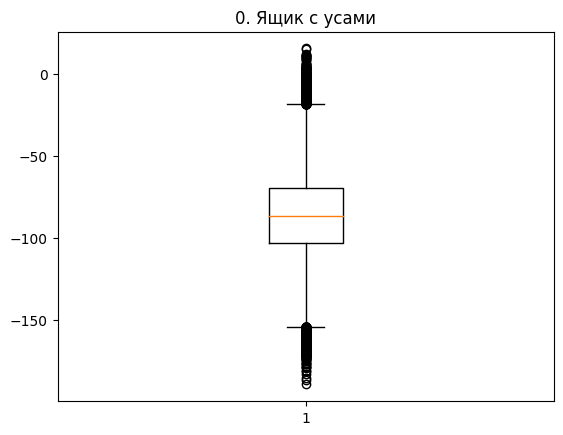

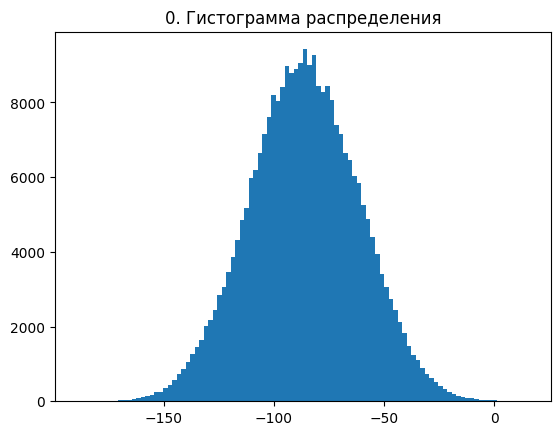

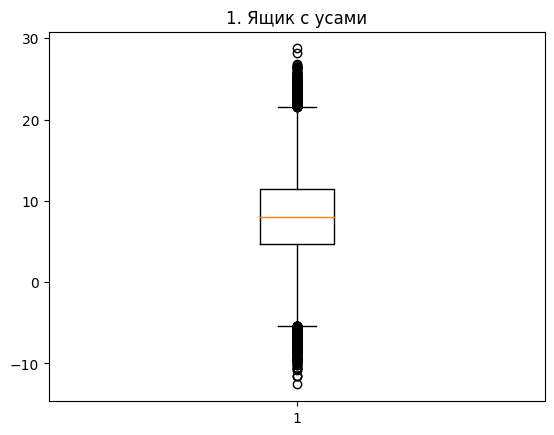

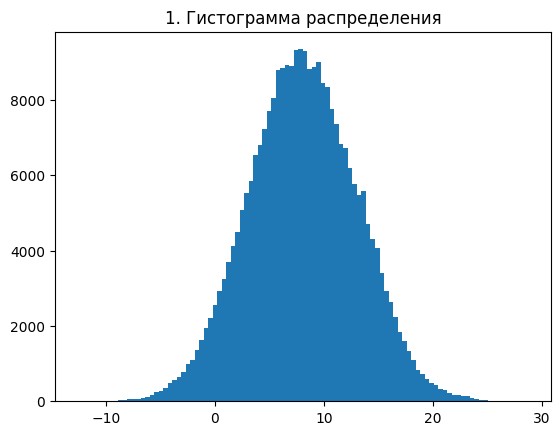

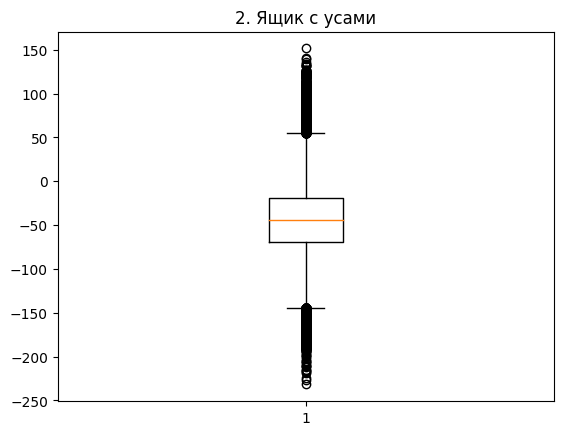

...

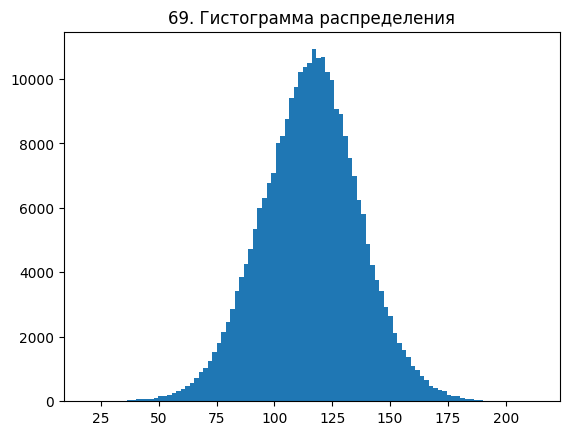

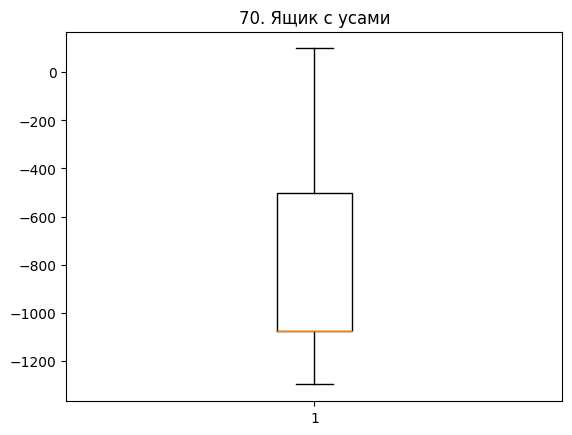

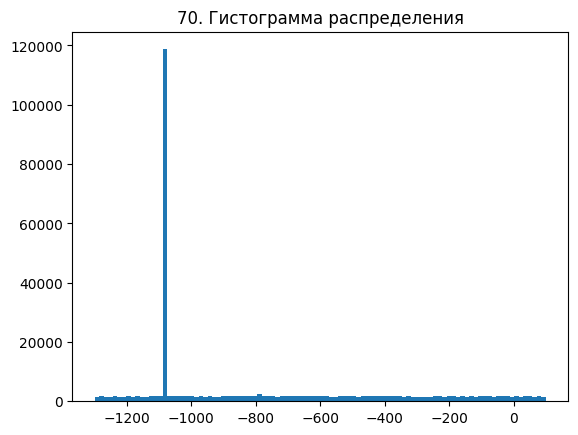

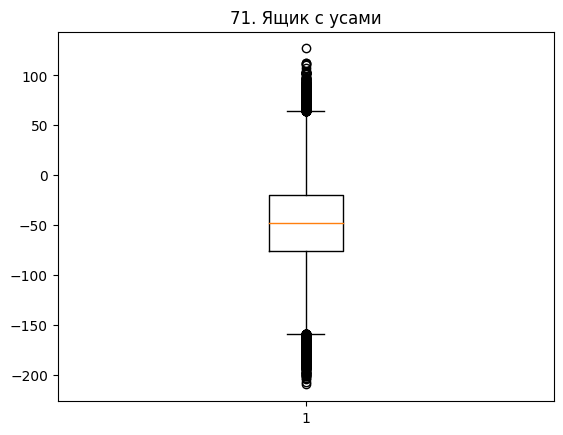

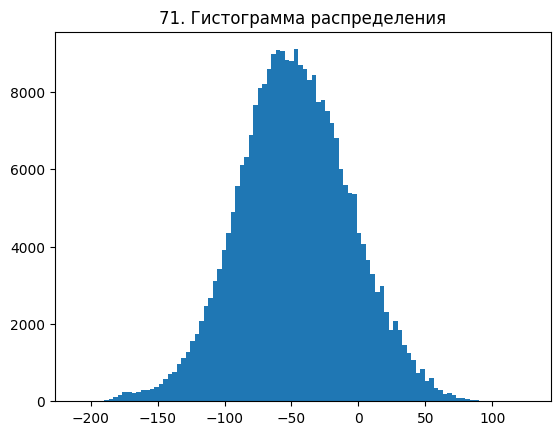

In [11]:
print('Датафрейм df_base')
build_plots(df_base)

Датафрейм df_train


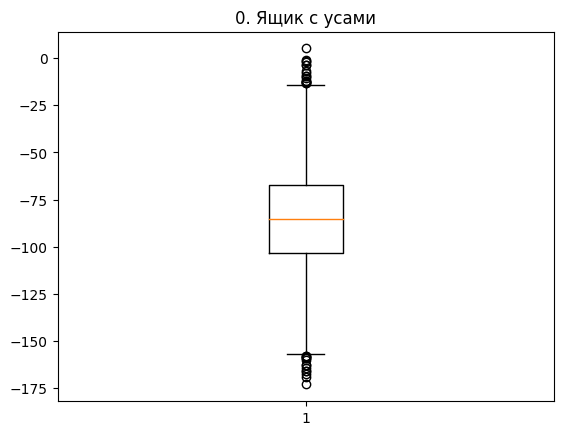

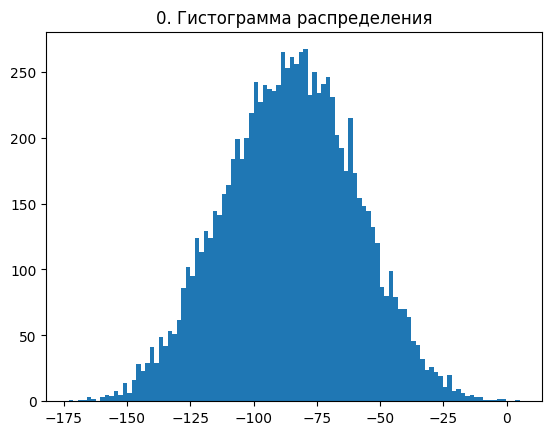

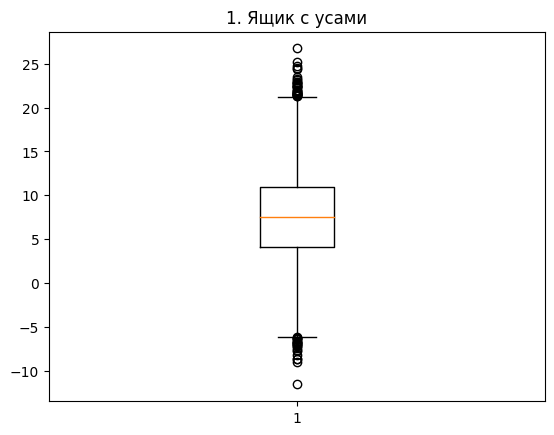

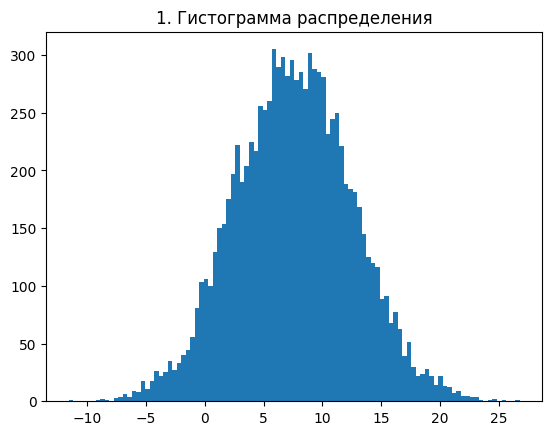

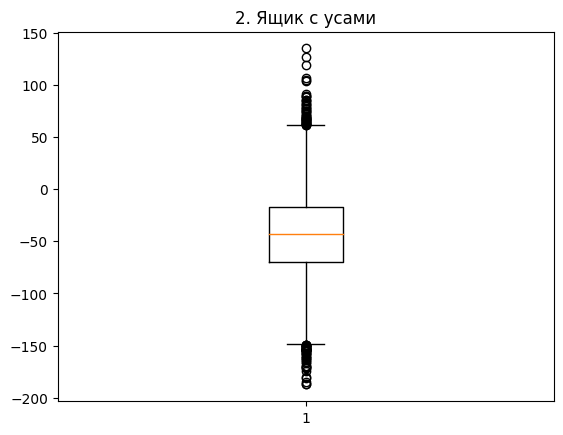

...

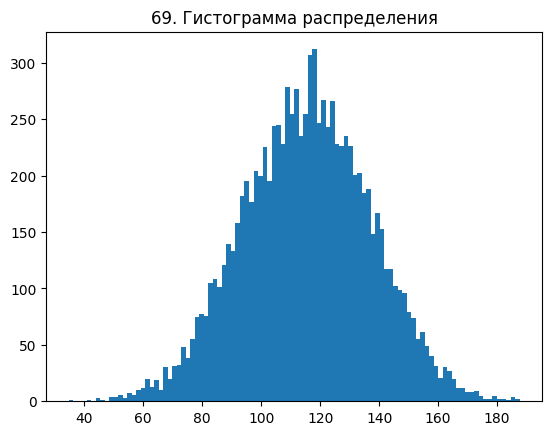

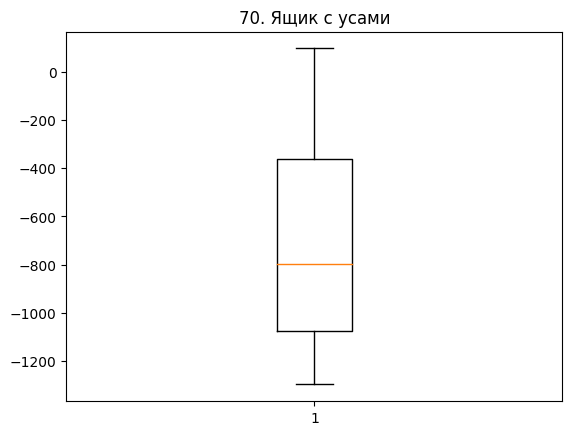

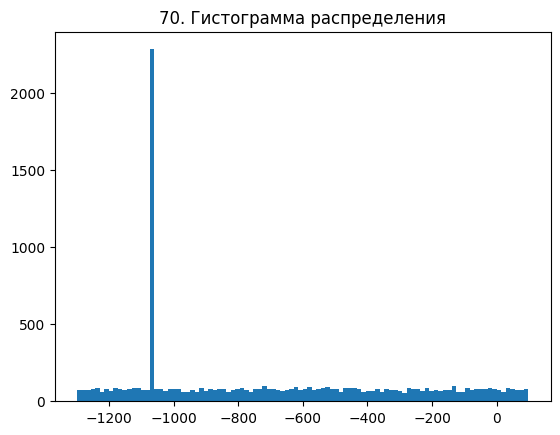

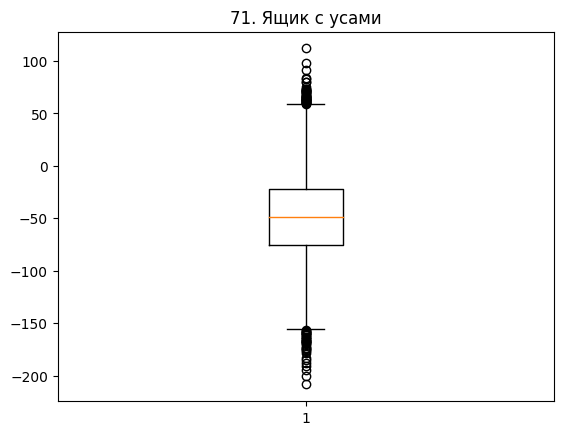

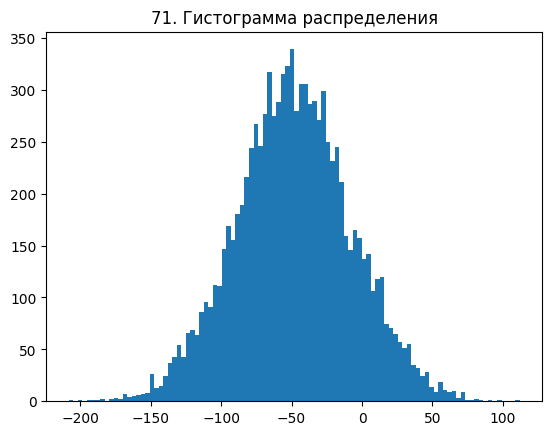

In [12]:
print('Датафрейм df_train')
build_plots(df_train)

In [13]:
# Список столбцов к удалению
columns_to_drop = ['6', '21', '25', '33', '44', '59', '65', '70']

**Выводы:** Анализ гистограмм распределения показал:
* распределение признаков схоже в 2-х датафреймах;
* большинство признаков имеет распределение, близкое к нормальному. Отличное от нормального распределения показывают признаки 6, 21, 25, 33, 44, 59, 65, 70. Удалим данные признаки при полдготовке данных к обучению модели.

Графики ящик с усами показывают наличие выбросов, при это аномально высоких или низких значений не выявлено.

## Корреляционный анализ данных

Построим матрицу phik корреляции для датафрейма `df_base`

In [14]:
phik_overview = df_base.sample(1000).phik_matrix()
plot_correlation_matrix(phik_overview.values, x_labels=phik_overview.columns, y_labels=phik_overview.index, 
                        vmin=0, vmax=1, color_map='Greens', title=r'correlation $\phi_K$', fontsize_factor=3,
                        figsize=(100,100))
plt.tight_layout()

interval columns not set, guessing: ['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23', '24', '25', '26', '27', '28', '29', '30', '31', '32', '33', '34', '35', '36', '37', '38', '39', '40', '41', '42', '43', '44', '45', '46', '47', '48', '49', '50', '51', '52', '53', '54', '55', '56', '57', '58', '59', '60', '61', '62', '63', '64', '65', '66', '67', '68', '69', '70', '71']


Построим матрицу phik корреляции для датафрейма `df_train`.

In [15]:
phik_overview = df_train.sample(1000).phik_matrix()
plot_correlation_matrix(phik_overview.values, x_labels=phik_overview.columns, y_labels=phik_overview.index, 
                        vmin=0, vmax=1, color_map='Greens', title=r'correlation $\phi_K$', fontsize_factor=3,
                        figsize=(100,100))
plt.tight_layout()

interval columns not set, guessing: ['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23', '24', '25', '26', '27', '28', '29', '30', '31', '32', '33', '34', '35', '36', '37', '38', '39', '40', '41', '42', '43', '44', '45', '46', '47', '48', '49', '50', '51', '52', '53', '54', '55', '56', '57', '58', '59', '60', '61', '62', '63', '64', '65', '66', '67', '68', '69', '70', '71']


**Выводы:** График не показывает сильной корреляции между признаками. Мультиколинеарность между признакми не выявлена.

## Подготовка данных

Для тренировочной выборки выделим target-признак и остальные признаки.

In [16]:
targets = df_train["Target"]
df_train.drop("Target", axis=1, inplace=True)

Для валидационной выборки выделим правильные ответы.

In [17]:
targets_valid = df_valid_answers["Expected"]

Удалим признаки, с распределение отличным от нормального.

In [18]:
df_base.drop(columns_to_drop, axis= 1 , inplace= True )
df_train.drop(columns_to_drop, axis= 1 , inplace= True )
df_valid.drop(columns_to_drop, axis= 1 , inplace= True )

Проведем скалирование признаков. Все они числовые, используем StandartScaler.

In [19]:
scaler = StandardScaler()
df_base[df_base.columns] = scaler.fit_transform(df_base[df_base.columns])
df_train[df_train.columns] = scaler.fit_transform(df_train[df_train.columns])
df_valid[df_valid.columns] = scaler.fit_transform(df_valid[df_valid.columns])

**Выводы:** В рамках раздела:
* был выделен target-признак из train выборки;
* выделен target-признак для валидационной выборки;
* удалены признаки,имеющие распределение отличное от нормального;|
* произведено скалирование для датафреймов base, train и valid.

## FAISS

### Получение оптимальных параметров для модели FAISS

Подготовим функцию для расчета метрики accuracy и времени работы поиска модели FAISS.

In [20]:
def get_faiss_accuracy(df_base, df_train, n_cells, nprobe, candidate_number):
    """
    Процедура осуществляет обучения модели faiss на основе датафрейма df_base и далее поиск в датафрейме df_train.
    Вычисляет метрику accuracy @ и время поиска в секундах.

    @param df_base: датафрейм для обучения faiss
           df_train: датафрейм для осуществления поиска
           n_cells: количество ячеек
           n_probe: количество ближайших ячеек к поиску
           candidate_number: количество кандидатов к поиску
    """ 
    
    # Построим обратный файловый индекс
    dims = df_base.shape[1]
    n_cells = n_cells
    quantizer = faiss.IndexFlatL2(dims)
    idx_l2 = faiss.IndexIVFFlat(quantizer, dims, n_cells)
    # Обучим модель
    idx_l2.train(np.ascontiguousarray(df_base.values).astype('float32'))
    idx_l2.add(np.ascontiguousarray(df_base.values).astype('float32'))
    # Произведем поиск @candidate_number
    base_index = {k: v for k, v in enumerate(df_base.index.to_list())}
    candidate_number = candidate_number
    idx_l2.nprobe = nprobe
    start = time.time()
    r, idx = idx_l2.search(np.ascontiguousarray(df_train.values).astype('float32'), candidate_number)
    end = time.time()
    # Посчитаем метрику accuracy@candidate_number
    acc = 0
    for target, el in zip(targets.values.tolist(), idx.tolist()):
        acc += int(target in [base_index[r] for r in el])
    print('\n n_cells', n_cells) 
    print('nprobe', nprobe)
    print(f'Accuracy @ {candidate_number} = {acc / len(idx):.1%}')
    print('Time to search (sec)', nprobe)

Найдем оптимальные значения n_cells и n_probe, используя списки значений для проверки.

In [21]:
cells = [10, 20, 50, 100, 200]
probes = [1, 10, 20, 50, 100]

In [22]:
for cell in cells:
    for probe in probes:
        get_faiss_accuracy(df_base, df_train, cell, probe, 5)


 n_cells 10
nprobe 1
Accuracy @ 5 = 66.7%
Time to search (sec) 1

 n_cells 10
nprobe 10
Accuracy @ 5 = 79.0%
Time to search (sec) 10

 n_cells 10
nprobe 20
Accuracy @ 5 = 79.0%
Time to search (sec) 20

 n_cells 10
nprobe 50
Accuracy @ 5 = 79.0%
Time to search (sec) 50

 n_cells 10
nprobe 100
Accuracy @ 5 = 79.0%
Time to search (sec) 100

 n_cells 20
nprobe 1
Accuracy @ 5 = 66.7%
Time to search (sec) 1

 n_cells 20
nprobe 10
Accuracy @ 5 = 78.8%
Time to search (sec) 10

 n_cells 20
nprobe 20
Accuracy @ 5 = 79.0%
Time to search (sec) 20

 n_cells 20
nprobe 50
Accuracy @ 5 = 79.0%
Time to search (sec) 50

 n_cells 20
nprobe 100
Accuracy @ 5 = 79.0%
Time to search (sec) 100

 n_cells 50
nprobe 1
Accuracy @ 5 = 66.5%
Time to search (sec) 1

 n_cells 50
nprobe 10
Accuracy @ 5 = 78.0%
Time to search (sec) 10

 n_cells 50
nprobe 20
Accuracy @ 5 = 78.7%
Time to search (sec) 20

 n_cells 50
nprobe 50
Accuracy @ 5 = 79.0%
Time to search (sec) 50

 n_cells 50
nprobe 100
Accuracy @ 5 = 79.0%
Time 

**Выводы:** Лучший показатель метрики, который удалось достичь - 79%. Лучшее временной показатель - 10 секунд для параметром n_cells = 10 и n_probe = 10.

### Применение оптимальных параметров FAISS к валидационной выборке

Применим ранее полученные оптимальные параметры к валидационной выборке.

In [23]:
# Построим обратный файловый индекс
dims = df_base.shape[1]
n_cells = 10
quantizer = faiss.IndexFlatL2(dims)
idx_l2 = faiss.IndexIVFFlat(quantizer, dims, n_cells)

# Обучим модель
idx_l2.train(np.ascontiguousarray(df_base.values).astype('float32'))
idx_l2.add(np.ascontiguousarray(df_base.values).astype('float32'))
# Произведем поиск @candidate_number
base_index = {k: v for k, v in enumerate(df_base.index.to_list())}

candidate_number = 5
idx_l2.nprobe = 10

r, idx = idx_l2.search(np.ascontiguousarray(df_valid.values).astype('float32'), candidate_number)

Посчитаем метрику accuracy@5 для valid.

In [24]:
acc = 0
for target, el in zip(targets_valid.values.tolist(), idx.tolist()):
    acc += int(target in [base_index[r] for r in el])
print(f'Accuracy @ {candidate_number} = {acc / len(idx):.1%}')

Accuracy @ 5 = 78.2%


**Выводы:** Метрика Accuracy@5 для валидационной выборки составила 78.2%.

## Выводы

В результате задачи была обучена модель faiss с параметрами n_cells = 10 и nprobe = 10. На валидационной выборке полученная модель показала метрику качества accuracy@5 равную 78.2%.

Перед построением модели были выполнены следующие шаги:
* были успешно созданы 4 датафрейма `df_base`, `df_train`, `df_valid` и `df_valid_answers` на основе исходных csv-файлов. Все указанные поля из описания задачи присутствуют в соответствующих датафреймах;
* удалены явные дубликаты в датафреймах `df_base`, `df_train`;
* произведен исследовательский анализ данных для датафреймов `df_base`, `df_train`:
    * распределение признаков схоже в 2-х датафреймах;
    * большинство признаков имеет распределение, близкое к нормальному. Отличное от нормального распределения показывают признаки 6, 21, 25, 33, 44, 59, 65, 70. Удалим данные признаки при полдготовке данных к обучению модели;
    * графики ящик с усами показывают наличие выбросов, при этом аномально высоких или низких значений не выявлено;
* произведене корреляционный анализ данных для датафреймов `df_base`, `df_train` - мультиколлинеарность не была выявлена;
* произведена подготовка данных для обучения модели;
* найдены оптимальные параметры модели.